In [52]:
#https://www.kaggle.com/datasets/mnassrib/telecom-churn-datasets/

import pandas as pd

df = pd.read_csv("churn-bigml-80.csv")
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [53]:
# checking for empty rows
df.isnull().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [54]:
# finding out about the datatypes of each column for preprocessing and transformation
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [55]:
# checking mean and standard deviation of each column to apply appropriate scaling while preprocessing
df.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [56]:
# encoding columns with strings and bools in the dataframe to ordinal integer values
from sklearn.preprocessing import OrdinalEncoder
ord_enc = OrdinalEncoder()
df[["International plan", "Voice mail plan", "Churn"]] = ord_enc.fit_transform(df[["International plan", "Voice mail plan", "Churn"]])


In [57]:
# dropping the "State" column as it does not effect the churn
df.drop(columns=["State"], axis= 1, inplace= True)
df.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,0.0,1.0,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0.0
1,107,415,0.0,1.0,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0.0
2,137,415,0.0,0.0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0.0
3,84,408,1.0,0.0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0.0
4,75,415,1.0,0.0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0.0


In [58]:
# splitting the dataframe into label
y = df["Churn"]
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: Churn, dtype: float64

In [59]:
# splitting the dataframe into features
X = df.drop(["Churn"], axis= 1)
X.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,415,0.0,1.0,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,415,0.0,1.0,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,415,0.0,0.0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,408,1.0,0.0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,415,1.0,0.0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


Shape of your Data Set loaded: (2666, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  8
    Number of Integer-Categorical Columns =  8
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  2
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    18 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################
To fix these data quali

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Account length,int64,0.000000,7,1.000000,243.000000,Column has 12 outliers greater than upper bound (208.00) or lower than lower bound(-8.00). Cap them or remove them.
Area code,int64,0.000000,0,408.000000,510.000000,No issue
International plan,float64,0.000000,0,0.000000,1.000000,No issue
Voice mail plan,float64,0.000000,0,0.000000,1.000000,No issue
Number vmail messages,int64,0.000000,1,0.000000,50.000000,Column has 2 outliers greater than upper bound (47.50) or lower than lower bound(-28.50). Cap them or remove them.
Total day minutes,float64,0.000000,NA,0.000000,350.800000,Column has 21 outliers greater than upper bound (324.65) or lower than lower bound(34.65). Cap them or remove them.
Total day calls,int64,0.000000,4,0.000000,160.000000,Column has 18 outliers greater than upper bound (154.50) or lower than lower bound(46.50). Cap them or remove them.
Total day charge,float64,0.000000,NA,0.000000,59.640000,"Column has 21 outliers greater than upper bound (55.18) or lower than lower bound(5.90). Cap them or remove them., Column has a high correlation with ['Total day minutes']. Consider dropping one of them."
Total eve minutes,float64,0.000000,NA,0.000000,363.700000,Column has 17 outliers greater than upper bound (339.80) or lower than lower bound(60.60). Cap them or remove them.
Total eve calls,int64,0.000000,4,0.000000,170.000000,Column has 15 outliers greater than upper bound (154.50) or lower than lower bound(46.50). Cap them or remove them.


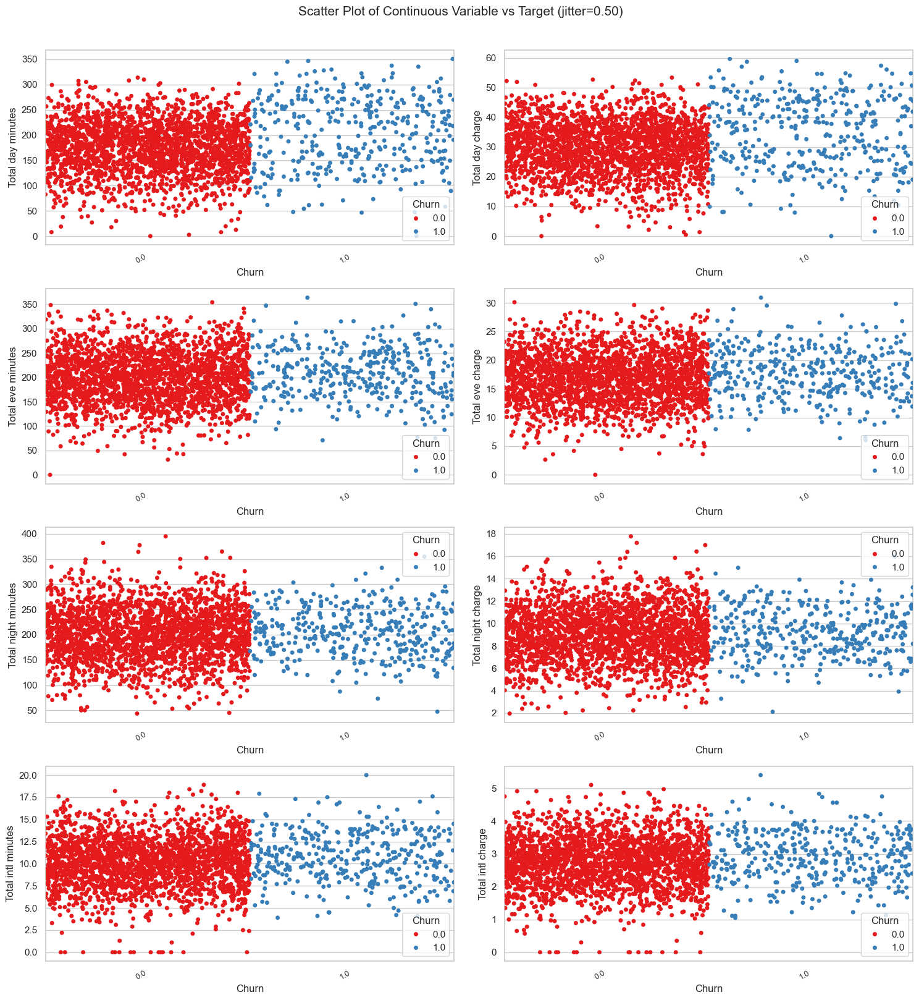

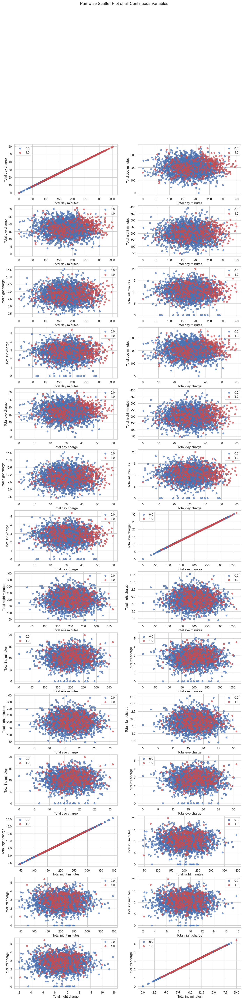

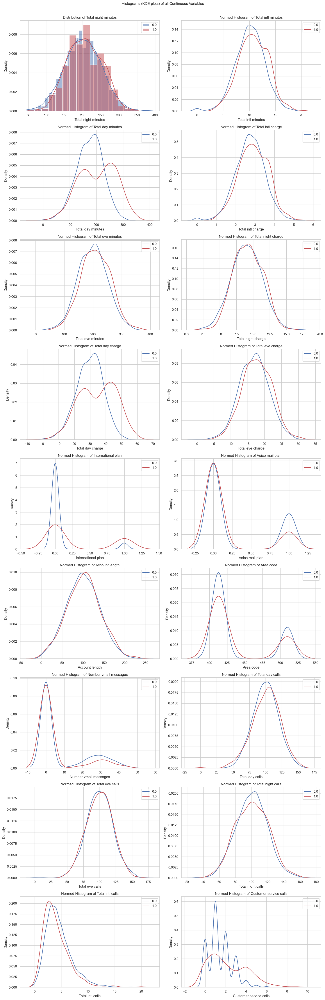

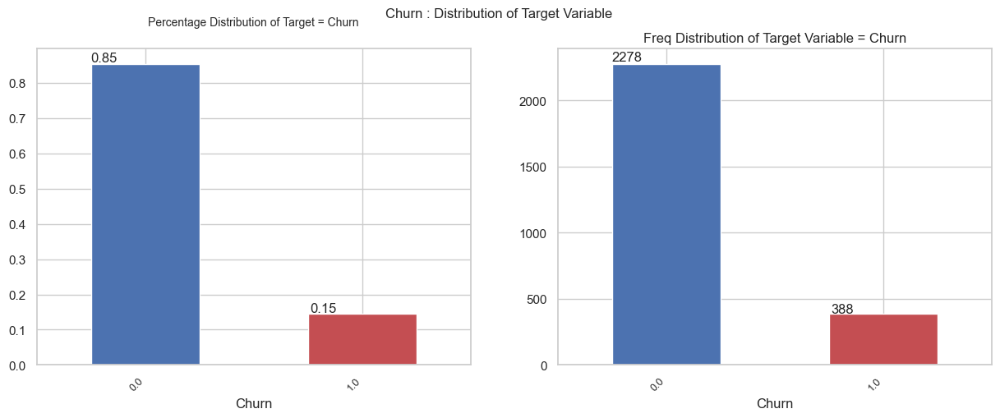

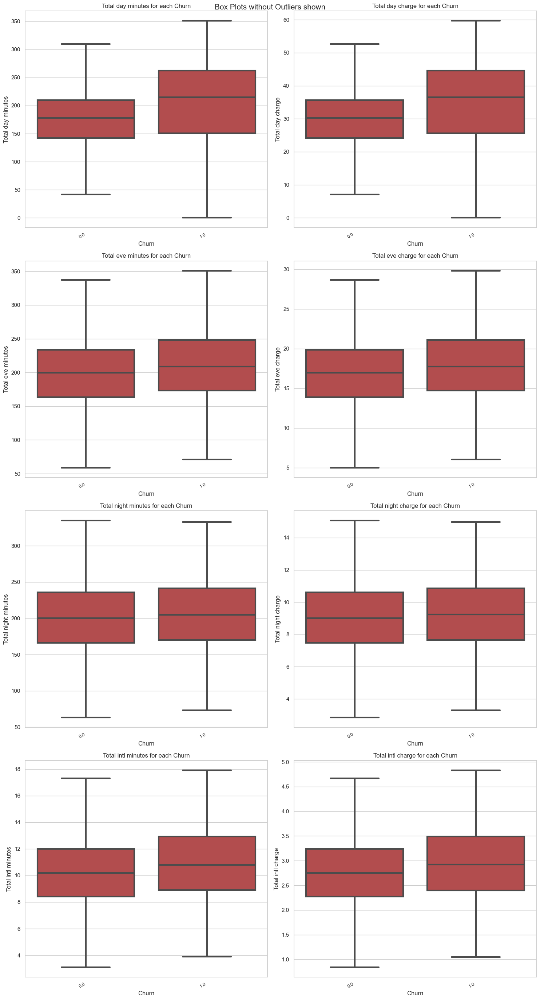

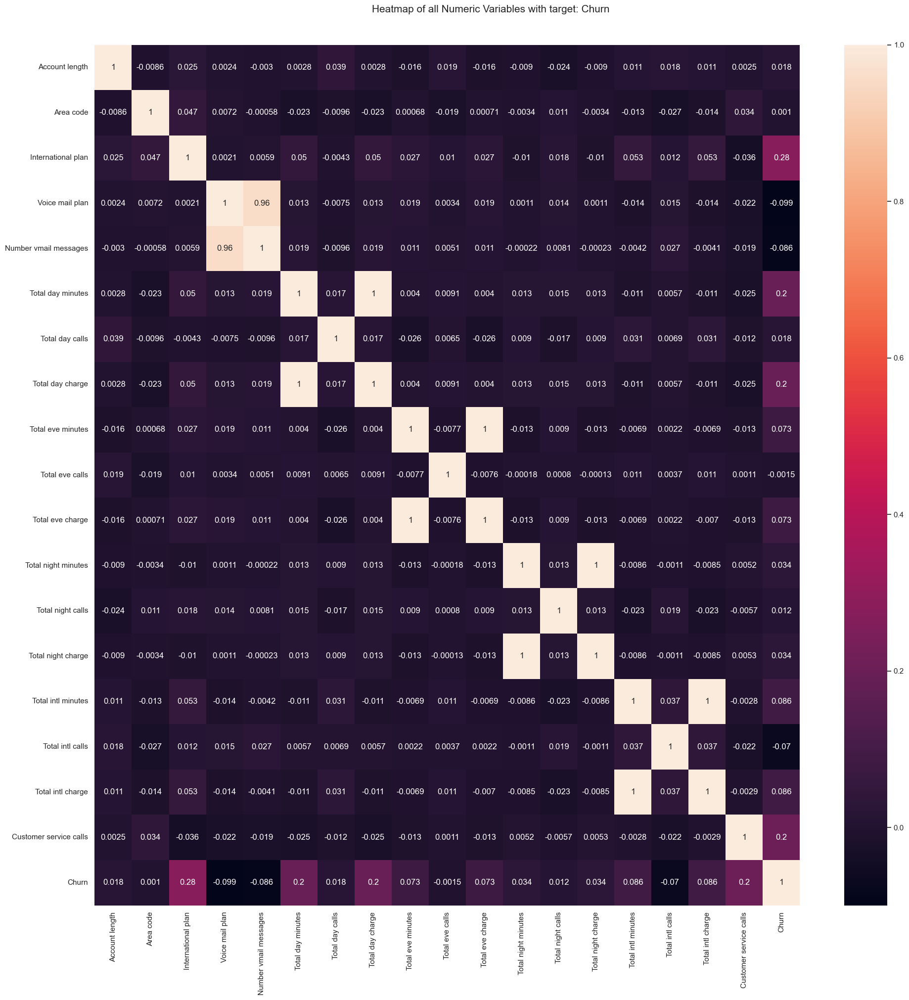

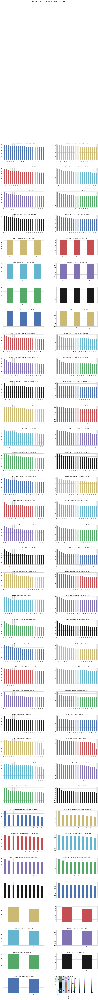

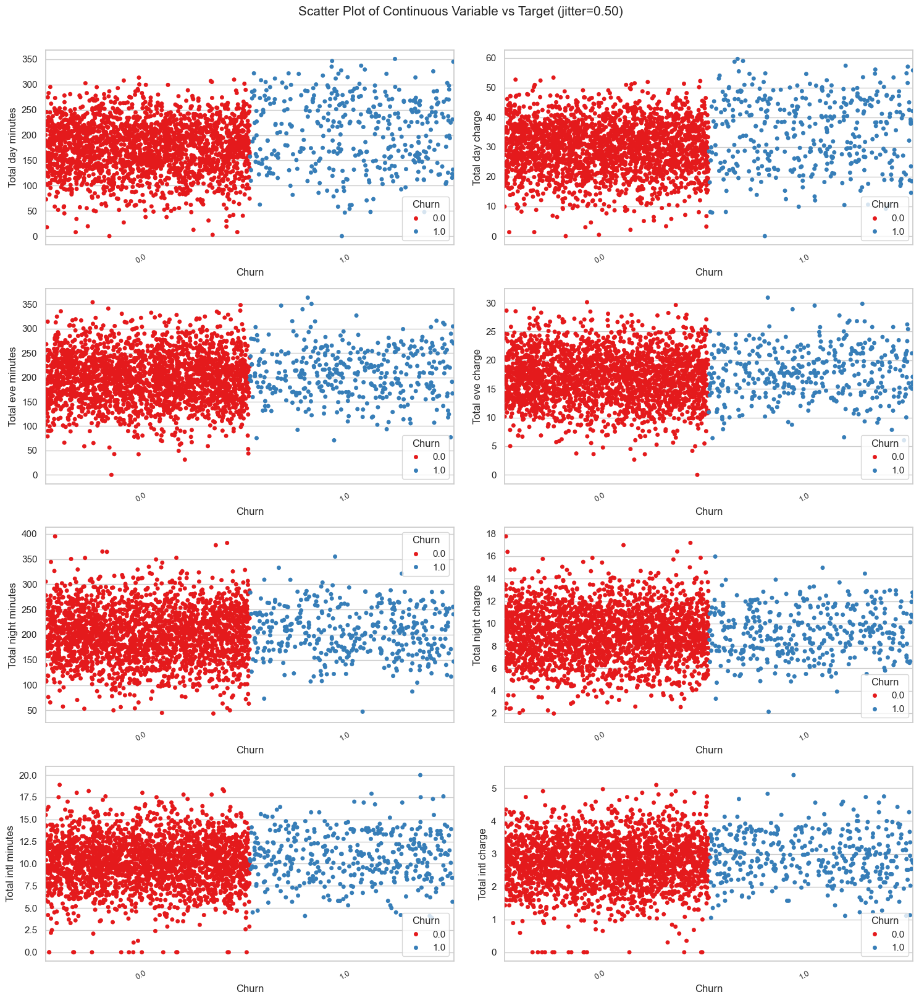

Total Number of Scatter Plots = 36


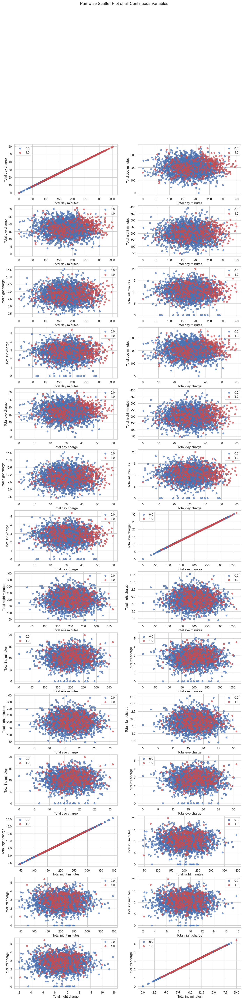

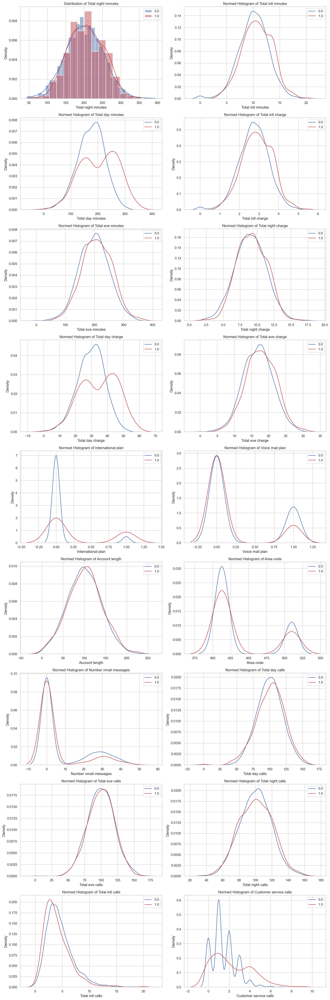

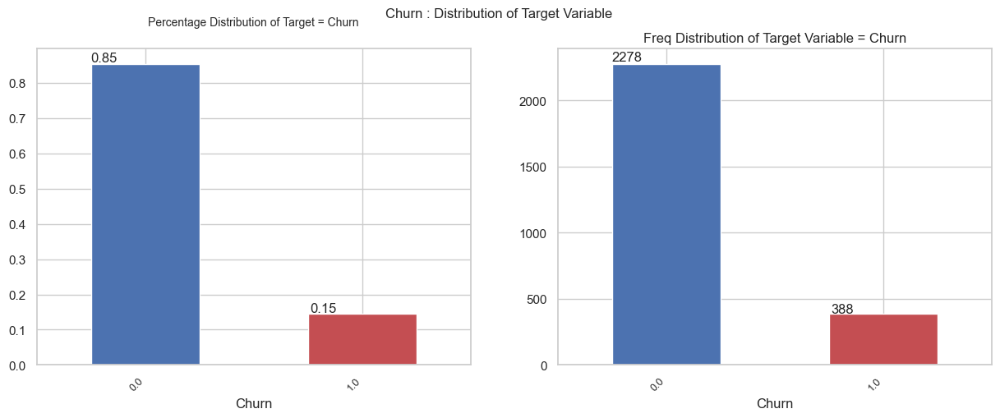

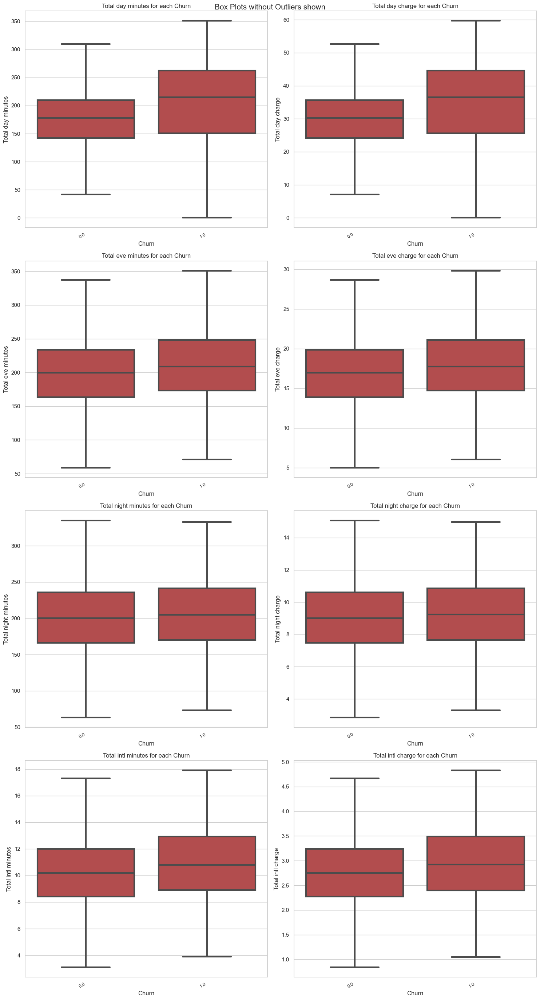

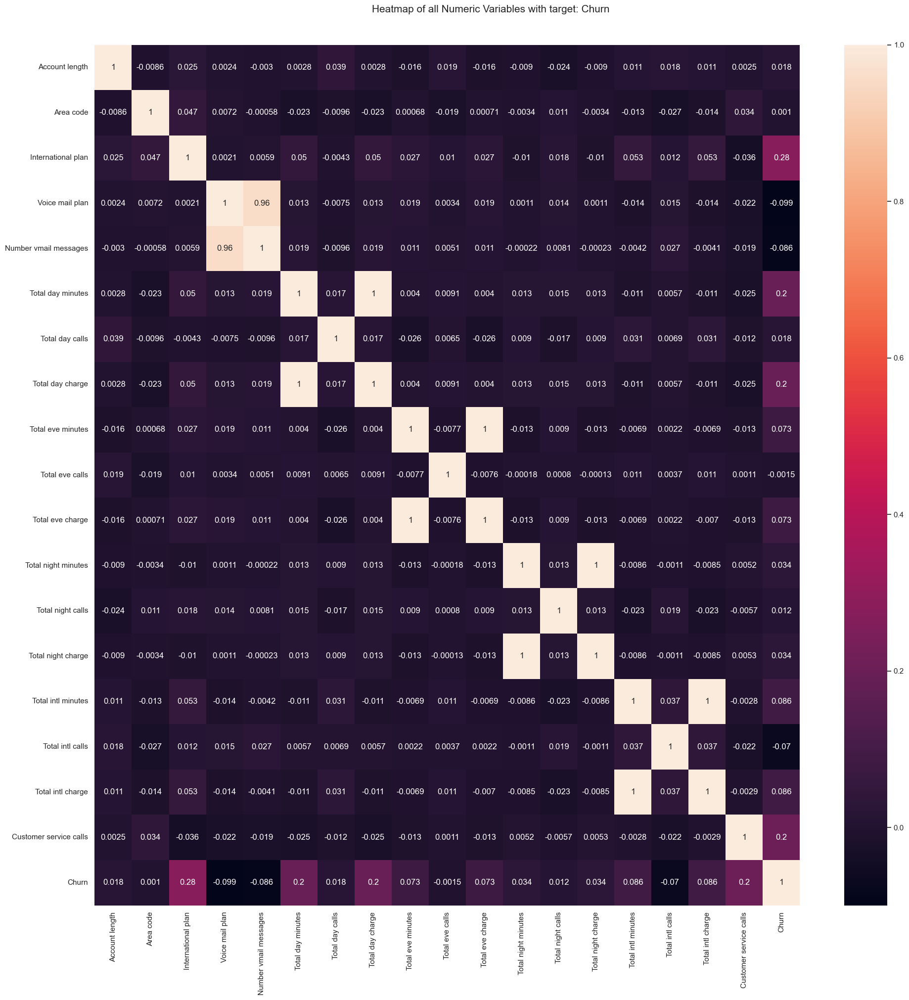

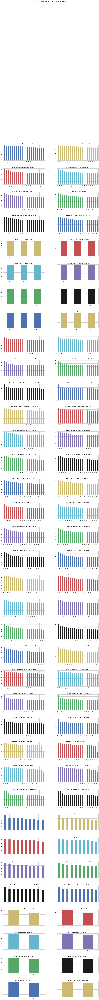

All Plots done
Time to run AutoViz = 67 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [60]:
# visualizing the dataset
%matplotlib inline
from autoviz import AutoViz_Class
AV = AutoViz_Class()
df_viz = AV.AutoViz(filename= None, dfte= df, sep= ",", verbose= 1, depVar= "Churn")

In [61]:
#normalizing and splitting data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import maxabs_scale


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3)

# scaling the data and changing the data back to dataframe as the scaled data is returned in numpy array format
X_train = pd.DataFrame(maxabs_scale(X_train), columns= X.columns)
X_test = pd.DataFrame(maxabs_scale(X_test), columns= X.columns)

In [62]:
# importing models
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

# importing gridsearchcv for hyperparameter tuning
from sklearn.model_selection import GridSearchCV

In [63]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
dtc_predict = dtc.predict(X_test)

In [64]:
nb = GaussianNB()
nb.fit(X_train, y_train)
nb_predict = nb.predict(X_test)

In [65]:
# performing hyperparameter tuning on RandomForestClassifier by changing the number of trees in the forest for best possible outcome
rfc = GridSearchCV(estimator= RandomForestClassifier(), param_grid= {"n_estimators": [50, 100, 125, 150, 200]})
rfc.fit(X_train, y_train)
rfc_predict = rfc.predict(X_test)
# best estimators found by hyperparameter tuning
rfc.best_params_

{'n_estimators': 125}

In [66]:
# using liblinear as the solver since it supports l1 and l2 penalities. performing hyperparameter tuning on the penalities to see which one fits our use case
# l1 penalty is sparse while l2 is non sparse
lr = GridSearchCV(estimator= LogisticRegression(), param_grid= {"solver": ["liblinear"], "penalty": ["l1", "l2"]})
lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)
# best penalty found by hyperparameter tuning
lr.best_params_

{'penalty': 'l1', 'solver': 'liblinear'}

In [67]:
svc = SVC()
svc.fit(X_train, y_train)
svc_predict = svc.predict(X_test)

In [68]:
import seaborn as sns
from sklearn.metrics import classification_report
# making list of models and their outputs to loop over and pass them to classification report
predicts = [dtc_predict, nb_predict, rfc_predict, lr_predict, svc_predict]
models = ["decision tree classifier", "naive bayes (guassian)", "random forest regressor", "logisitc regression", "support vector machines"]
# classification report of each model
for predictions, model in zip(predicts, models):
    print(f" model: {model} \n {classification_report(y_test, predictions)}\n")

 model: decision tree classifier 
               precision    recall  f1-score   support

         0.0       0.95      0.90      0.93       698
         1.0       0.50      0.70      0.58       102

    accuracy                           0.87       800
   macro avg       0.73      0.80      0.75       800
weighted avg       0.90      0.87      0.88       800


 model: naive bayes (guassian) 
               precision    recall  f1-score   support

         0.0       0.94      0.90      0.92       698
         1.0       0.47      0.59      0.52       102

    accuracy                           0.86       800
   macro avg       0.70      0.74      0.72       800
weighted avg       0.88      0.86      0.87       800


 model: random forest regressor 
               precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       698
         1.0       0.80      0.76      0.78       102

    accuracy                           0.95       800
   macro avg       0.88 

<Axes: >

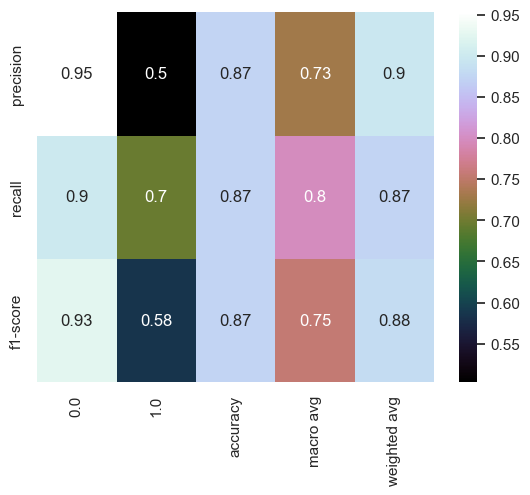

In [69]:
#.iloc[:-1] removes support from the output
dtc_report = classification_report(y_test, dtc_predict, output_dict= True)

dtc_report = pd.DataFrame(dtc_report).iloc[:-1]
sns.heatmap(data= dtc_report, annot= True, fmt= ".2g", cmap= "cubehelix")

<Axes: >

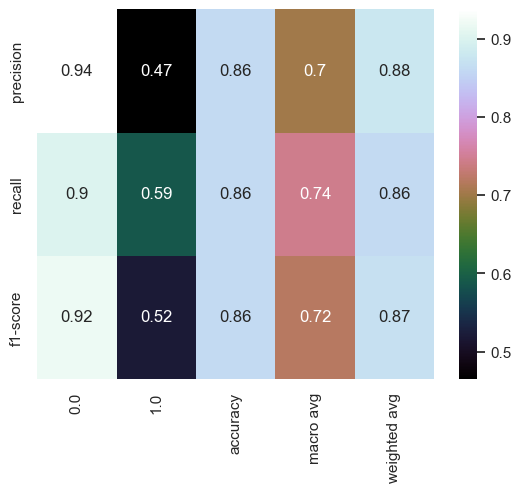

In [70]:
nb_report = classification_report(y_test, nb_predict, output_dict= True)

nb_report = pd.DataFrame(nb_report).iloc[:-1]
sns.heatmap(data= nb_report, annot= True, fmt= ".2g", cmap= "cubehelix")

<Axes: >

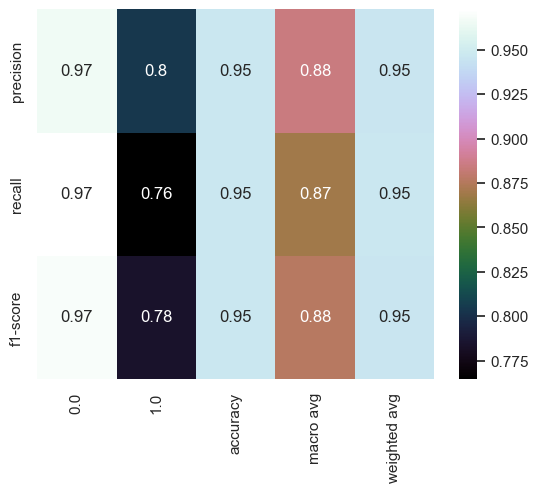

In [71]:
rfc_report = classification_report(y_test, rfc_predict, output_dict= True)

rfc_report = pd.DataFrame(rfc_report).iloc[:-1]
sns.heatmap(data= rfc_report, annot= True, fmt= ".2g", cmap= "cubehelix")

<Axes: >

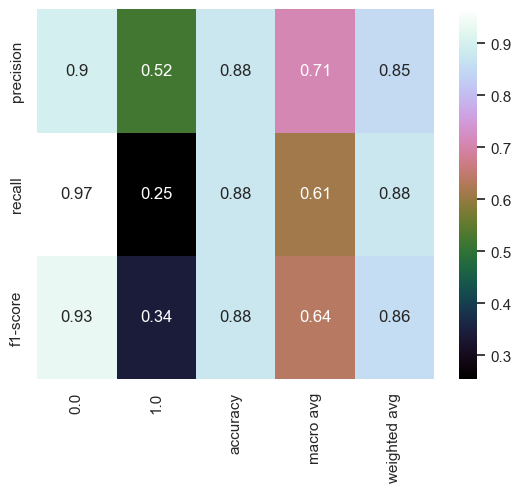

In [72]:
lr_report = classification_report(y_test, lr_predict, output_dict= True)

lr_report = pd.DataFrame(lr_report).iloc[:-1]
sns.heatmap(data= lr_report, annot= True, fmt= ".2g", cmap= "cubehelix")

<Axes: >

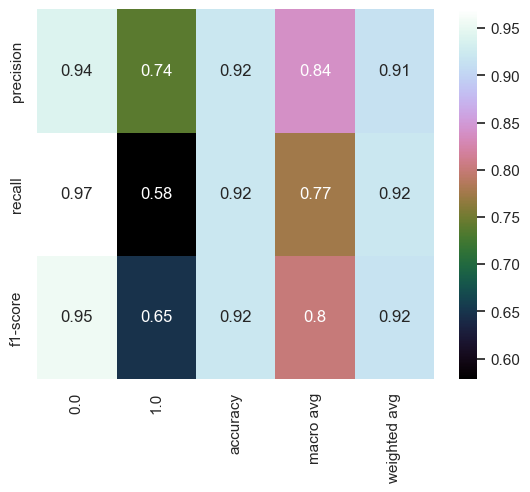

In [73]:
svc_report = classification_report(y_test, svc_predict, output_dict= True)

svc_report = pd.DataFrame(svc_report).iloc[:-1]
sns.heatmap(data= svc_report, annot= True, fmt= ".2g", cmap= "cubehelix")

In [74]:
# loading unseen data and applying the same preprocessing to it
df_unseen = pd.read_csv("churn-bigml-20.csv")
df_unseen[["International plan", "Voice mail plan", "Churn"]] = ord_enc.fit_transform(df_unseen[["International plan", "Voice mail plan", "Churn"]])

x_unseen = df_unseen.drop(["Churn", "State"], axis= 1)
y_unseen = df_unseen["Churn"]

x_unseen.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,117,408,0.0,0.0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1
1,65,415,0.0,0.0,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4
2,161,415,0.0,0.0,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4
3,111,415,0.0,0.0,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2
4,49,510,0.0,0.0,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1


In [75]:
y_unseen.head()

0    0.0
1    1.0
2    1.0
3    0.0
4    0.0
Name: Churn, dtype: float64

In [76]:
x_unseen = pd.DataFrame(maxabs_scale(x_unseen), columns= x_unseen.columns)

In [77]:
# using the pretrained model to predict upon unseen data
dtc_predict_unseen = dtc.predict(x_unseen)
nb_predict_unseen = nb.predict(x_unseen)
rfc_predict_unseen = rfc.predict(x_unseen)
lr_predict_unseen = lr.predict(x_unseen)
svc_predict_unseen = svc.predict(x_unseen)

In [78]:
predicts_unseen = [dtc_predict_unseen, nb_predict_unseen, rfc_predict_unseen, lr_predict_unseen, svc_predict_unseen]
models = ["decision tree classifier", "naive bayes (guassian)", "random forest regressor", "logisitc regression", "support vector machines"]
# classification report of each model
for predictions, model in zip(predicts_unseen, models):
    print(f" model: {model} \n {classification_report(y_unseen, predictions)}\n")

 model: decision tree classifier 
               precision    recall  f1-score   support

         0.0       0.96      0.91      0.93       572
         1.0       0.58      0.75      0.65        95

    accuracy                           0.89       667
   macro avg       0.77      0.83      0.79       667
weighted avg       0.90      0.89      0.89       667


 model: naive bayes (guassian) 
               precision    recall  f1-score   support

         0.0       0.94      0.88      0.91       572
         1.0       0.49      0.68      0.57        95

    accuracy                           0.85       667
   macro avg       0.72      0.78      0.74       667
weighted avg       0.88      0.85      0.86       667


 model: random forest regressor 
               precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       572
         1.0       0.84      0.82      0.83        95

    accuracy                           0.95       667
   macro avg       0.90 

From the above result we can conclude that random forests model has the best accuracy out of all the other models on unseen data

TODO: add confusion matrix for unseen data